## SVD Compression Reconstruction notebook
This notebook computes the SVD of the three datasets, a,b,c as follows:

* svd(a+b) test on c
* svd(a+c) test on b
* svd(b+c) test on a


* Be careful, this notebook generates large intermediate files that are saved. If you don't want them, delete them afterwards. 
* ffmpeg must be installed for the create_movie to work. (.gif isn't working anymore???)
* Open questions: why are the relative errors and SVD vectors the same even though the datasets are different?

## Build the lists of datasets

In [ ]:
import os, sys
sys.path.append('..')
import torch
from torch.utils.data import Dataset, DataLoader
from surrogates4sims.pnnlDatasets import CCSI_2D, inversePreprocessFcn
import numpy as np
import matplotlib.pyplot as plt
from surrogates4sims.utils import rmse, create_movie, convertSimToImage, computeSpatialandTimePOD, \
                                  reconFrame, pkl_load, pkl_save
from tqdm import tqdm
from multiprocessing import Pool
from numpy.linalg import norm

In [ ]:
dataDirec = '/data/ccsi/PNNLTimeStepData/'
sims = ['001','025','050']
interpMethod = ['linear']#,'cubic']
numComp = 1000 # 1000 is the max
preprocess = False
channels = [0] # right now only do 1 channel at a time. 
gridSize = 512
channel = channels[0]
reconOutFile = 'channel{}_pnnl_{}_recons.pkl'.format(channel,gridSize)

## Compute and save the SVD of each pair of datasets
make sure to recompute the SVD of the time vectors

linear
025
050
0


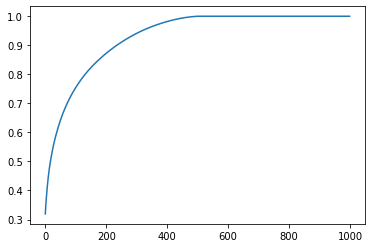

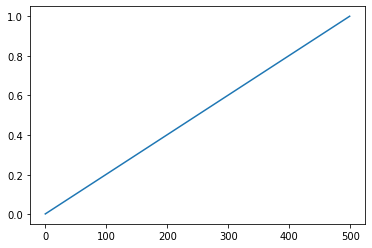

(262144, 1000) (1000,) (500, 500)
--------------------------------------------------------------------------------
001
050
0


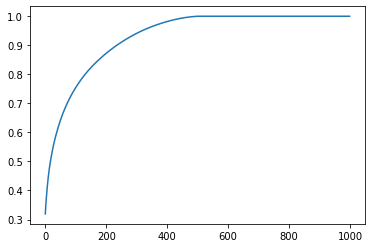

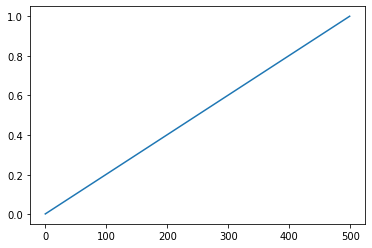

(262144, 1000) (1000,) (500, 500)
--------------------------------------------------------------------------------
001
025
0


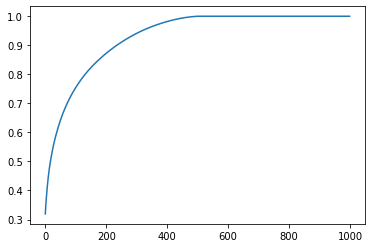

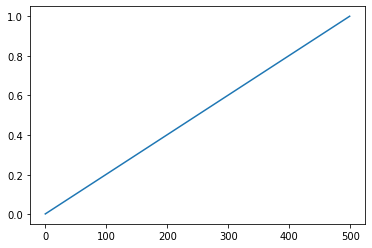

(262144, 1000) (1000,) (500, 500)
--------------------------------------------------------------------------------


In [ ]:
for mth in interpMethod:
    print(mth)
    for s in sims:
        pkl_file = 'channel{}_{}_{}_'.format(channel,mth,gridSize)
        data = []
        for ss in sims:
            if ss != s:
                pkl_file = pkl_file + '{}_'.format(ss)
                print(ss)
                fn = os.path.join(dataDirec,'data_{}x{}_{}'.format(gridSize,gridSize,mth),ss+'.pkl')
                D = CCSI_2D(fn,preprocess=preprocess)
                data.append(D.data)
        D = np.vstack(data)
        svd_pnnl_dict = dict(zip(channels,[dict()]*len(channels)))
        for channel in channels:
            print(channel)
            E = D[:,channel].squeeze()
#             E = []
#             numSamps = D.shape[0]
#             for i in range(numSamps):
#                 E.append(D[i,channel])
#             E = np.array(E)
            spatialVecsColumns, S, timeVecsRows = computeSpatialandTimePOD(E,simLen=500,doPlot=True)
            print(spatialVecsColumns.shape, S.shape, timeVecsRows.shape)
            svd_pnnl_dict[channel]['spatialVecsColumns'] = spatialVecsColumns.copy()
            svd_pnnl_dict[channel]['S'] = S.copy()
            svd_pnnl_dict[channel]['timeVecsRows'] = timeVecsRows.copy()
        pkl_save(svd_pnnl_dict, pkl_file + '.pkl')
        print('-'*80)

In [ ]:
D0 = svd_pnnl_dict #pkl_load('linear_128_025_050_.pkl')
for k,v in D0.items():
    print(k)
    for kk, vv in v.items():
        print(kk,vv.shape)

0
spatialVecsColumns (262144, 1000)
S (1000,)
timeVecsRows (500, 500)


In [ ]:
D0[channel]

{'spatialVecsColumns': array([[-2.0808566e-03,  9.2693104e-04, -1.6059022e-03, ...,
         -1.6251353e-03,  1.3391851e-03, -9.3030894e-01],
        [-2.2302151e-03,  5.0238433e-04,  9.7174116e-04, ...,
         -2.9648589e-02, -2.3892665e-02, -2.9064719e-02],
        [-1.8476550e-03, -4.7398520e-05, -4.3498602e-04, ...,
          8.9679621e-03,  1.7510591e-01, -8.7895496e-03],
        ...,
        [-1.9447040e-03,  8.4803614e-05,  1.9593132e-04, ...,
         -1.4915691e-04, -1.4522930e-03,  1.9010376e-04],
        [-1.9389391e-03,  8.3200313e-05,  1.9811137e-04, ...,
         -7.1674673e-05, -9.3417475e-04,  1.4378736e-04],
        [-1.9090388e-03,  8.8158500e-05,  1.8032332e-04, ...,
          3.8815695e-05,  1.5280836e-03,  5.2841668e-05]], dtype=float32),
 'S': array([1.04446631e+03, 6.35691261e+01, 5.11773376e+01, 4.67272873e+01,
        4.54504051e+01, 4.16893158e+01, 4.00399437e+01, 3.61690559e+01,
        3.38882599e+01, 3.21244736e+01, 3.12055721e+01, 2.85104752e+01,
       

In [ ]:
# for i in range(spatialVecsColumns1.shape[1]):
#     v = spatialVecsColumns1[:,i]
#     v = v.reshape(128,128)
#     plt.imshow(v)
#     plt.title(str(i))
#     plt.show()

## Reconstructions 

In [ ]:
def reconSim(svd_data,ccsi_dataset,numComp=1000,channels=None):
    dataLoader = DataLoader(ccsi_dataset,batch_size=len(D))
    X,y = next(iter(dataLoader))
    X = X.detach().numpy()
    if channels is None:
        numChannels = X.shape[1]
        channels = list(range(numChannels))
        
    R = np.empty_like(X)
    for channel in tqdm(channels):
        spatialVecsColumns = svd_data[channel]['spatialVecsColumns']
        E = X[:,channel,:,:].squeeze()
        out = list(map(lambda x: reconFrame(spatialVecsColumns,x,numComp=numComp), E))
        out = np.array(out)
        R[:,channel] = out
    return R[:,channels], X[:,channels]

In [ ]:
recons = dict()
for mth in interpMethod:
    recons[mth] = dict()
    for s in sims:
        svd_file = 'channel{}_{}_{}_'.format(channel,mth,gridSize)
        data = []
        for ss in sims:
            if ss != s:
                svd_file = svd_file + '{}_'.format(ss)
        svd_file = svd_file + '.pkl'
        svd_data = pkl_load(svd_file)
        fn = os.path.join(dataDirec,'data_{}x{}_{}'.format(gridSize,gridSize,mth),s+'.pkl')
        D = CCSI_2D(fn,preprocess=preprocess)
        print(fn)
        print(svd_file)
        R,X = reconSim(svd_data,D,numComp=1000,channels=channels)
        print(R.shape)
        recons[mth][s] = (R,X)
    
pkl_save(recons,reconOutFile)

/data/ccsi/PNNLTimeStepData/data_512x512_linear/001.pkl
channel0_linear_512_025_050_.pkl


100%|██████████| 1/1 [16:12<00:00, 972.64s/it]


(500, 1, 512, 512)
/data/ccsi/PNNLTimeStepData/data_512x512_linear/025.pkl
channel0_linear_512_001_050_.pkl


100%|██████████| 1/1 [24:47<00:00, 1487.96s/it]


(500, 1, 512, 512)
/data/ccsi/PNNLTimeStepData/data_512x512_linear/050.pkl
channel0_linear_512_001_025_.pkl


100%|██████████| 1/1 [24:31<00:00, 1471.73s/it]


(500, 1, 512, 512)


## Metrics

In [ ]:
def plot_rel_err(R,X):
    errors = []
    for channel in range(X.shape[1]):
        RR = R[:,channel].squeeze()
        XX = X[:,channel].squeeze()
        rel_err = [] 
        for a,b in zip(RR,XX):
            rel_err.append(norm(a-b)/norm(b))
        plt.plot(rel_err)
        plt.title('{}'.format(channel))
        plt.show()
        errors.append(rel_err)
        return np.array(errors)

linear 001


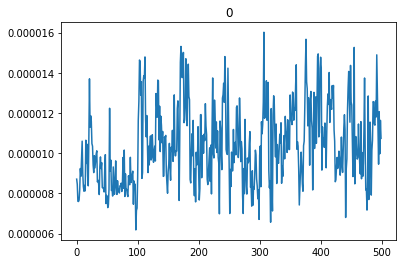

--------------------------------------------------------------------------------
linear 025


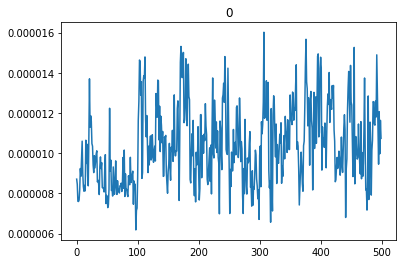

--------------------------------------------------------------------------------
linear 050


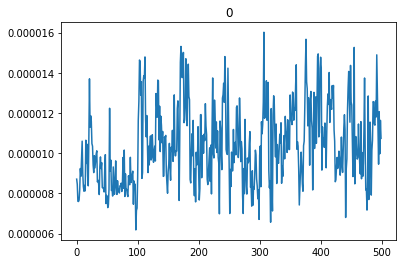

--------------------------------------------------------------------------------


In [ ]:
for k,v in recons.items():
    for kk,vv in v.items():
        print(k,kk)
        R,X = vv
        r = plot_rel_err(R,X)
        #print(r[:5])
        print('-'*80)

## Movies

In [ ]:
import matplotlib.animation as animation
import matplotlib.gridspec as gridspec
import matplotlib.animation as manimati
from matplotlib import animation, rc
def create_1_channel_movie(im,outfile='sim.mp4',title='surrogate            simulation'):
    ti = 0
    u_mx = 255 #np.max(np.abs(Xrgb))
    fig = plt.figure()
    ax = fig.add_subplot(111)
    plt.title(title)
    cmap = plt.cm.ocean
    img = ax.imshow(im[0], cmap=cmap, vmin=0, vmax=u_mx)
    #plt.show()
    
    # initialization function: plot the background of each frame
    def init():
        img = ax.imshow(im[0], cmap=cmap, vmin=0, vmax=u_mx)
        return (fig,)

    # animation function. This is called sequentially
    def animate(i):
        img = ax.imshow(im[i], cmap=cmap, vmin=0, vmax=u_mx)
        return (fig,)


    # call the animator. blit=True means only re-draw the parts that have changed.
    anim = animation.FuncAnimation(fig, animate, init_func=init,
                                   frames=len(im), interval=20, blit=True)
    anim.save(outfile, fps=30, extra_args=['-vcodec', 'libx264'])

In [ ]:
def make_PNNL_movie(surr, real, title='surrogate                    simulation', outfile='sim.mp4'):
    surr = surr.squeeze()
    surr = np.array(list(map(np.rot90,surr)))
    real = real.squeeze()
    real = np.array(list(map(np.rot90,real)))
    out = np.concatenate([surr,real],axis=2)
    im = convertSimToImage(torch.tensor(out))
    create_1_channel_movie(im,outfile=outfile,title=title)

  0%|          | 0/3 [00:00<?, ?it/s]

linear 001


 33%|███▎      | 1/3 [24:44<49:29, 1484.71s/it]

--------------------------------------------------------------------------------
linear 025


 67%|██████▋   | 2/3 [46:39<23:53, 1433.60s/it]

--------------------------------------------------------------------------------
linear 050


100%|██████████| 3/3 [1:08:35<00:00, 1371.70s/it]

--------------------------------------------------------------------------------


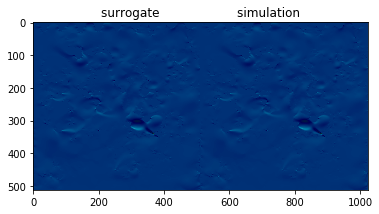

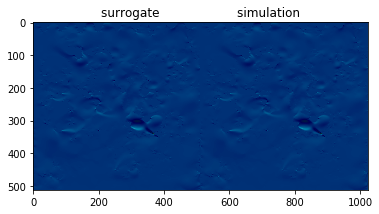

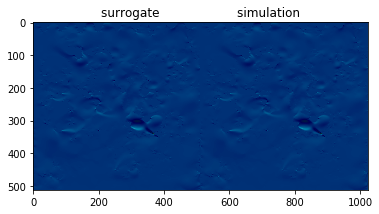

In [ ]:
from IPython.display import Image, Video
for k,v in recons.items():
    for kk,vv in tqdm(v.items()):
        print(k,kk)
        surr,real = vv
        s = '{}_{}_{}_channel{}.mp4'.format(k,kk,channel,gridSize)
        make_PNNL_movie(surr, real, title='surrogate                    simulation', outfile=s)
        #Video(filename=s)
        print('-'*80)

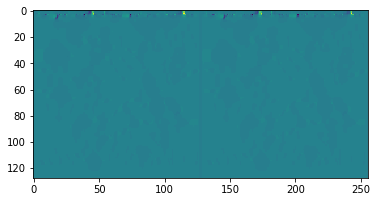

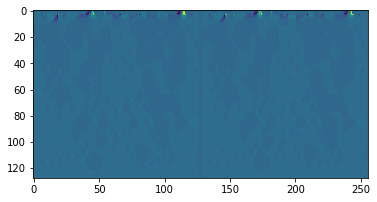

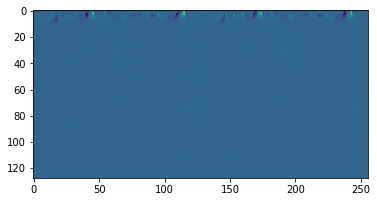

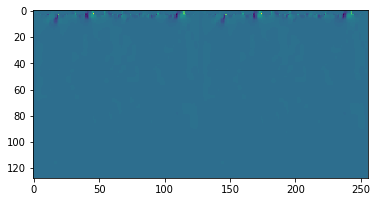

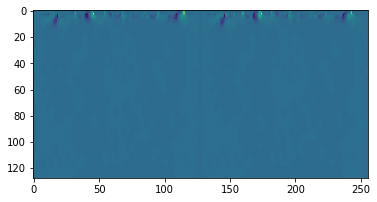

...

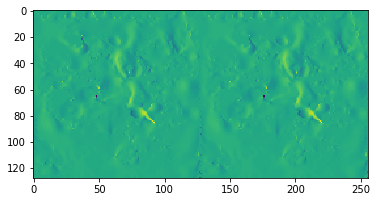

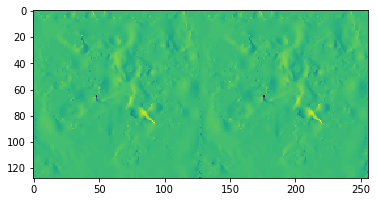

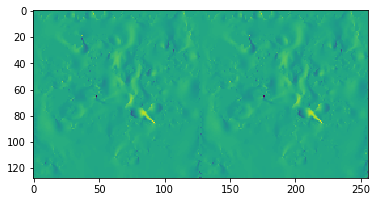

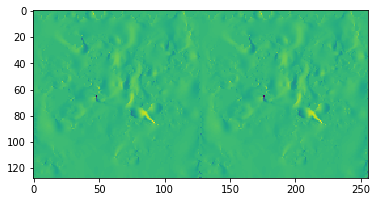

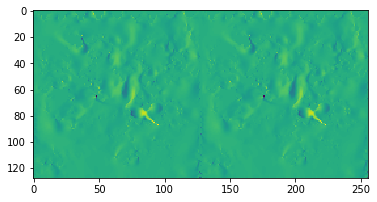

In [ ]:
for i in range(im.shape[0]):
    plt.imshow(im[i])
    plt.show()